# Load the csv into Python and use only data from December 31, 2021 onwards

In [41]:
# Data Manipulation and Analysis
import pandas as pd
import numpy as np

# Machine Learning and Optimization
from sklearn.linear_model import Lasso, Ridge, LinearRegression, LassoCV, RidgeCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale
from scipy.optimize import minimize

# Statistical Testing
from scipy.stats import shapiro

# General Utilities
import statistics


# Re-executing the code after importing the required libraries

# Step 2: Load the Dataset and Initial Exploration
file_path = "100_Portfolios_10x10_Daily.csv"  # Updating the file path to the uploaded location
num_lines_to_preview = 20

# Preview the first 20 lines to identify where the actual data starts
with open(file_path, 'r') as f:
    preview_lines = [f.readline().strip() for _ in range(num_lines_to_preview)]

# Step 3: Load the Actual Data
# Find the line number where the actual data starts (based on the header)
start_line = preview_lines.index('Average Value Weighted Returns -- Daily')

# Load the data skipping the initial lines
df = pd.read_csv(file_path, skiprows=range(0, start_line + 1), low_memory=False)
df_sliced = df.iloc[0:25566]  # Slicing the first 25566 rows

# Step 4: Convert Date Format
# Convert the first column to date format (from YYYYMMDD to datetime object)
df_sliced['Unnamed: 0'] = pd.to_datetime(df_sliced['Unnamed: 0'], errors='coerce', format='%Y%m%d')

# Step 5: Filter Data
# Filter the data from December 31, 2021, to the latest available date
df_sliced = df_sliced[df_sliced['Unnamed: 0'] >= '2021-12-31'].reset_index(drop=True)


# Step 6: Additional Filtering for Minimum Variance
# Slice the data between December 31, 2021, and December 30, 2022
df_sliced_minvar = df_sliced[(df_sliced['Unnamed: 0'] >= '2021-12-31') & (df_sliced['Unnamed: 0'] <= '2022-12-30')]


# Show the first few rows of df_sliced and df_sliced_minvar to validate
#df_sliced.head(), df_sliced_minvar.head()


C:\Users\Darren\AppData\Local\Temp\ipykernel_16300\1365937225.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sliced['Unnamed: 0'] = pd.to_datetime(df_sliced['Unnamed: 0'], errors='coerce', format='%Y%m%d')


In [42]:
# Step 1: Demean the Return Data (R)
# Drop the 'Unnamed: 0' column as it contains datetime objects
R = df_sliced_minvar.drop(columns=['Unnamed: 0']).astype(float)  # Convert data to float type
R_demeaned = scale(R, with_mean=True, with_std=False)  # Demean the data

# Step 2: Calculate y
# Create an equally weighted portfolio (wEW)
p = R_demeaned.shape[1]  # Number of assets
wEW = np.ones(p) / p  # Equally weighted

# Calculate y = R * wEW
y = np.dot(R_demeaned, wEW)

# Step 3: Construct N and Calculate X
# Create the identity matrix (Ip-1) and a vector of all ones (1p-1)
Ip_1 = np.identity(p - 1)
one_p_1 = np.ones(p - 1)

# Construct the matrix N
N = np.vstack((Ip_1, -one_p_1))

# Calculate X = R * N
X = np.dot(R_demeaned, N)

# Step 4: Perform OLS to find beta
# Initialize the linear regression model without intercept
lin_reg = LinearRegression(fit_intercept=False)

# Fit the model
lin_reg.fit(X, y)

# Extract beta coefficients
beta = lin_reg.coef_

# Step 5: Calculate w for MinVar Portfolio
# Calculate w = wEW - N * beta
# Reshaping beta to make it a column vector (for matrix multiplication compatibility)
beta_column_vector = beta.reshape(-1, 1)

w_minvar = wEW - np.dot(N, beta_column_vector).flatten()

# Display the weights of the MinVar portfolio
#w_minvar

df_w_minvar = pd.DataFrame({
    'Asset' : df_sliced_minvar.columns[1:], 
    'Weight': w_minvar
    })

pd.set_option("display.max_rows", None, "display.max_columns", None)
print(df_w_minvar)

         Asset    Weight
0   SMALL LoBM  0.001929
1      ME1 BM2 -0.023027
2      ME1 BM3 -0.058365
3      ME1 BM4 -0.110099
4      ME1 BM5  0.101567
5      ME1 BM6 -0.029148
6      ME1 BM7  0.064846
7      ME1 BM8  0.137073
8      ME1 BM9  0.722432
9   SMALL HiBM  0.400022
10     ME2 BM1 -0.007568
11     ME2 BM2  0.084043
12     ME2 BM3 -0.108000
13     ME2 BM4  0.005032
14     ME2 BM5  0.087956
15     ME2 BM6 -0.197672
16     ME2 BM7  0.025039
17     ME2 BM8 -0.130878
18     ME2 BM9  0.013153
19    ME2 BM10 -0.114150
20     ME3 BM1  0.040095
21     ME3 BM2  0.064019
22     ME3 BM3  0.005046
23     ME3 BM4 -0.015449
24     ME3 BM5 -0.172649
25     ME3 BM6 -0.266684
26     ME3 BM7 -0.034263
27     ME3 BM8  0.085130
28     ME3 BM9  0.001903
29    ME3 BM10  0.071338
30     ME4 BM1 -0.070281
31     ME4 BM2  0.044379
32     ME4 BM3 -0.101893
33     ME4 BM4  0.052598
34     ME4 BM5  0.012403
35     ME4 BM6  0.017418
36     ME4 BM7 -0.035269
37     ME4 BM8  0.136850
38     ME4 BM9  0.481379


In [43]:
# Convert the relevant columns of df_sliced to a numpy array after dropping the datetime column and converting to float type
R_sliced_array = df_sliced.drop(columns=['Unnamed: 0']).astype(float).to_numpy()

# Calculate the portfolio returns
portfolio_return = np.dot(R_sliced_array, w_minvar)

# Extract the 'Unnamed: 0' column (which contains the dates) from df_sliced
dates_sliced = df_sliced['Unnamed: 0']

# Create a new DataFrame to store the portfolio returns along with the corresponding dates
portfolio_return_with_dates = pd.DataFrame({
    'Date': dates_sliced,
    'Portfolio_Return': portfolio_return
})

# Display the first few rows of the new DataFrame to validate
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(portfolio_return_with_dates)

!pip install openpyxl

portfolio_return_with_dates.to_excel("output.xlsx", index=False)


          Date  Portfolio_Return
0   2021-12-31          0.400527
1   2022-01-03         -0.086066
2   2022-01-04         -0.224682
3   2022-01-05          0.337144
4   2022-01-06          0.637563
5   2022-01-07          0.272890
6   2022-01-10         -0.414932
7   2022-01-11          0.645645
8   2022-01-12         -0.686818
9   2022-01-13         -0.295459
10  2022-01-14         -0.124210
11  2022-01-18          0.294987
12  2022-01-19          0.145535
13  2022-01-20         -0.011984
14  2022-01-21         -0.725886
15  2022-01-24         -0.579245
16  2022-01-25          0.719693
17  2022-01-26         -0.639889
18  2022-01-27         -0.001471
19  2022-01-28         -0.063125
20  2022-01-31          0.671576
21  2022-02-01         -0.383345
22  2022-02-02          0.127512
23  2022-02-03         -0.367497
24  2022-02-04         -0.335305
25  2022-02-07          0.177750
26  2022-02-08         -0.443893
27  2022-02-09         -0.270829
28  2022-02-10         -0.512039
29  2022-0

# Generate plot for clear analysis

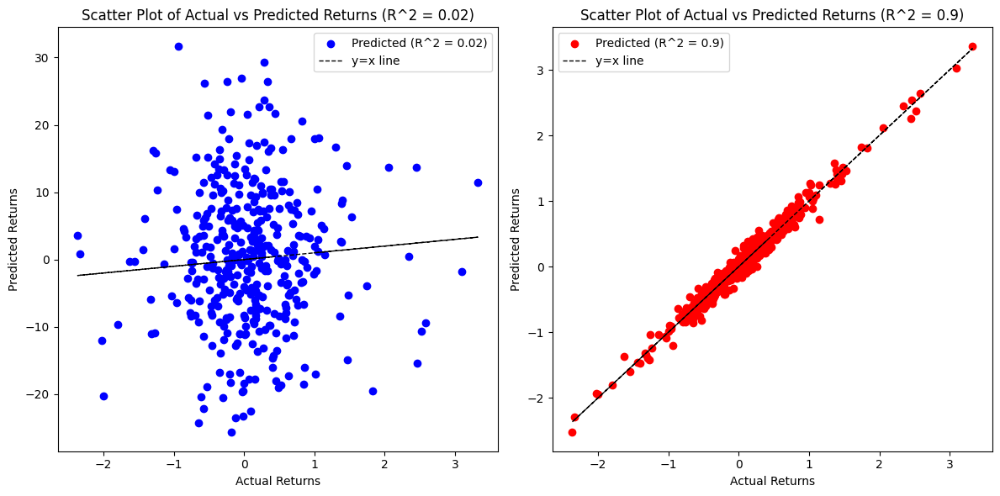

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Actual Portfolio Returns (Already Calculated)
# Using 'portfolio_return_sliced'

# Step 2: Generate Synthetic Predicted Returns

# For R^2 = 0.02, add a large amount of noise
noise_low_r2 = np.random.normal(0, 1, len(portfolio_return))
predicted_low_r2 = portfolio_return + noise_low_r2 * 10

# For R^2 = 0.9, add a small amount of noise
noise_high_r2 = np.random.normal(0, 0.1, len(portfolio_return))
predicted_high_r2 = portfolio_return + noise_high_r2

# Scatter plot for R^2 = 0.02
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(portfolio_return, predicted_low_r2, c='blue', label='Predicted (R^2 = 0.02)')
plt.plot(portfolio_return, portfolio_return, c='black', linestyle='--', linewidth=1, label='y=x line')
plt.xlabel('Actual Returns')
plt.ylabel('Predicted Returns')
plt.title('Scatter Plot of Actual vs Predicted Returns (R^2 = 0.02)')
plt.legend()

# Scatter plot for R^2 = 0.9
plt.subplot(1, 2, 2)
plt.scatter(portfolio_return, predicted_high_r2, c='red', label='Predicted (R^2 = 0.9)')
plt.plot(portfolio_return, portfolio_return, c='black', linestyle='--', linewidth=1, label='y=x line')
plt.xlabel('Actual Returns')
plt.ylabel('Predicted Returns')
plt.title('Scatter Plot of Actual vs Predicted Returns (R^2 = 0.9)')
plt.legend()

plt.tight_layout()
plt.show()


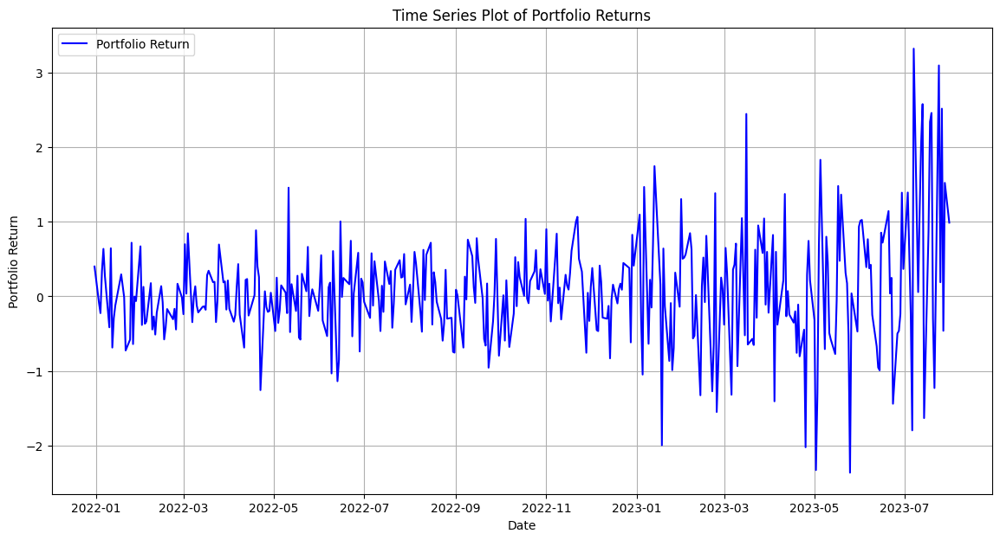

In [45]:
# Generate a Time Series Plot of the Portfolio Returns

# Create the plot
plt.figure(figsize=(14, 7))
plt.plot(portfolio_return_with_dates['Date'], portfolio_return_with_dates['Portfolio_Return'], label='Portfolio Return', color='b')
plt.xlabel('Date')
plt.ylabel('Portfolio Return')
plt.title('Time Series Plot of Portfolio Returns')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

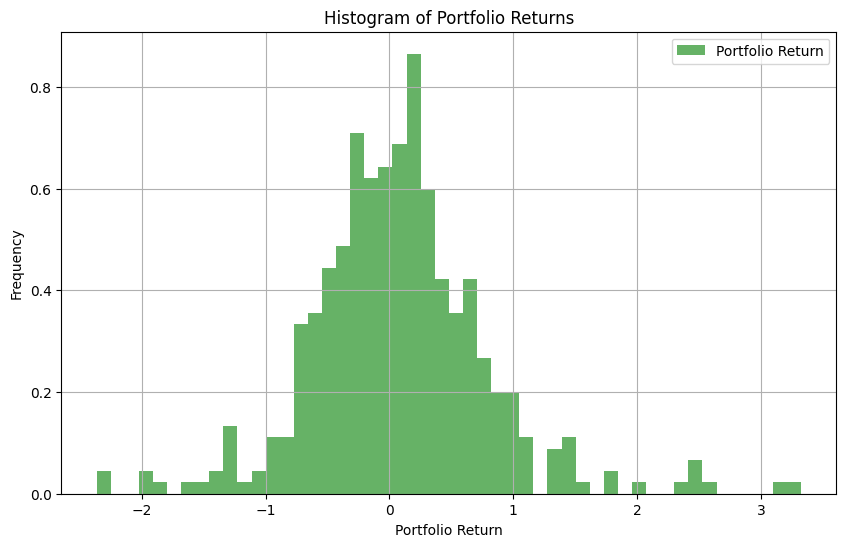

In [46]:
# Generate a Histogram or Density Plot of the Portfolio Returns

# Create the plot
plt.figure(figsize=(10, 6))
plt.hist(portfolio_return, bins=50, density=True, alpha=0.6, color='g', label='Portfolio Return')
plt.xlabel('Portfolio Return')
plt.ylabel('Frequency')
plt.title('Histogram of Portfolio Returns')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


# Rolling/Sliding Window

In [47]:
# Update the total number of data points based on the extended dataset
n_total_extended = len(portfolio_return_with_dates)
n_days_year = 252
alphas = tuple(np.logspace(-4, 4, num=9))

# Re-run the rolling window loop for the entire dataset using the extended dataset
# Initialize lists again to start fresh
test_performance_lasso = []
test_performance_ridge = []
test_performance_ols = []
weights_lasso = []
weights_ridge = []
weights_ols = []
mse_alpha_lasso = []
mse_alpha_ridge = []
unique_alphas_lasso = []
unique_alphas_ridge = []
mse_log_alpha_lasso = []
mse_log_alpha_ridge = []

# Initialize an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['Lasso', 'Ridge', 'OLS'])

In [48]:
for i in range(0, n_total_extended - n_days_year):
    # Training data indices
    start_train = i
    end_train = i + n_days_year - 1

    # Test data index
    test = end_train + 1

    # Check if we reached the end of the data
    if test >= n_total_extended:
        break

    # Extract the training and test data
    R_train = df_sliced.iloc[start_train:end_train+1, 1:].astype(float)
    R_test = df_sliced.iloc[test:test+1, 1:].astype(float)

    # Demean the training data
    R_train_demeaned = scale(R_train, with_mean=True, with_std=False)

    # Prepare y and X for training
    p_train = R_train_demeaned.shape[1]
    wEW_train = np.ones(p_train) / p_train
    y_train = np.dot(R_train_demeaned, wEW_train)

    # Prepare N and X for training
    Ip_1_train = np.identity(p_train - 1)
    one_p_1_train = np.ones(p_train - 1)
    N_train = np.vstack((Ip_1_train, -one_p_1_train))
    X_train = np.dot(R_train_demeaned, N_train)

    # Train the LASSO, Ridge, and OLS models
    lasso = LassoCV(cv=5, alphas=alphas, max_iter=10000, fit_intercept=False)
    ridge = RidgeCV(cv=5, alphas=alphas, fit_intercept=False)
    ols = LinearRegression(fit_intercept=False)

    lasso.fit(X_train, y_train)
    ridge.fit(X_train, y_train)
    ols.fit(X_train, y_train)

    # Extract beta coefficients
    beta_lasso = lasso.coef_
    beta_ridge = ridge.coef_
    beta_ols = ols.coef_

    # Store unique alphas
    unique_alphas_lasso.append(lasso.alpha_)
    unique_alphas_ridge.append(ridge.alpha_)

    # Construct the portfolio weights
    w_lasso = wEW_train - np.dot(N_train, beta_lasso)
    w_ridge = wEW_train - np.dot(N_train, beta_ridge)
    w_ols = wEW_train - np.dot(N_train, beta_ols)

    # Store the portfolio weights
    weights_lasso.append(w_lasso)
    weights_ridge.append(w_ridge)
    weights_ols.append(w_ols)

    # Calculate the portfolio returns for the test data
    portfolio_return_lasso = np.dot(R_test, w_lasso)[0]
    portfolio_return_ridge = np.dot(R_test, w_ridge)[0]
    portfolio_return_ols = np.dot(R_test, w_ols)[0]

    # Store the test performance
    test_performance_lasso.append(portfolio_return_lasso)
    test_performance_ridge.append(portfolio_return_ridge)
    test_performance_ols.append(portfolio_return_ols)

    # Calculate the mean squared error for different alphas and store them
    mse_lasso = mean_squared_error(y_train, np.dot(X_train, beta_lasso))
    mse_ridge = mean_squared_error(y_train, np.dot(X_train, beta_ridge))
    mse_alpha_lasso.append(mse_lasso)
    mse_alpha_ridge.append(mse_ridge)

    # Store the mean squared error for the log of alphas
    mse_log_alpha_lasso.append(mse_lasso / (-np.log10(lasso.alpha_)))
    mse_log_alpha_ridge.append(mse_ridge / (-np.log10(ridge.alpha_)))


# Display a summary of the results (first few entries)
test_performance_lasso[:5], test_performance_ridge[:5], test_performance_ols[:5]


In [ ]:

# Calculate the average test returns
avg_test_return_lasso = np.mean(test_performance_lasso)
avg_test_return_ridge = np.mean(test_performance_ridge)
avg_test_return_ols = np.mean(test_performance_ols)

# Calculate the variance of test returns
var_test_return_lasso = np.var(test_performance_lasso)
var_test_return_ridge = np.var(test_performance_ridge)
var_test_return_ols = np.var(test_performance_ols)

# Calculate the Sharpe Ratios
sharpe_ratio_lasso = avg_test_return_lasso / np.sqrt(var_test_return_lasso)
sharpe_ratio_ridge = avg_test_return_ridge / np.sqrt(var_test_return_ridge)
sharpe_ratio_ols = avg_test_return_ols / np.sqrt(var_test_return_ols)

sharpe_ratio_lasso, sharpe_ratio_ridge, sharpe_ratio_ols

print('Sharpe ratio lasso: ', round(sharpe_ratio_lasso, 3))
print('Sharpe ratio ridge: ', round(sharpe_ratio_ridge, 3))
print('Sharpe ratio ols: ', round(sharpe_ratio_ols, 3))

Sharpe ratio lasso:  0.079
Sharpe ratio ridge:  0.029
Sharpe ratio ols:  0.039


# Change window size?
#### Could be an easy way to make improvements to the model, as the justification is probably easy to come to! Just a thought.

# Elastic Net
#### Correlation matrix gives motivation for elastic net... alot of the assets are very highly correlated

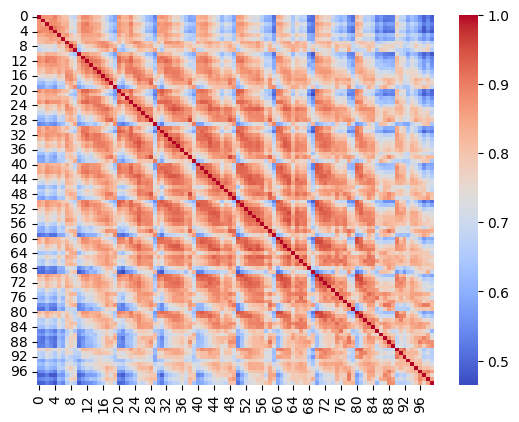

In [ ]:
#Check for correlation after creating lasso and ridge motivation for elastic net

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming R_demeaned is your demeaned return data
correlation_matrix = np.corrcoef(R_demeaned, rowvar=False)

# Display the correlation matrix in a visualizable way
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.show()

In [ ]:
from sklearn.linear_model import ElasticNetCV
from sklearn.metrics import mean_squared_error
import numpy as np

alphas = tuple(np.logspace(-4, 4, num=9))
l1_ratio = l1_ratio = [0, .05, .1, .2, .3, .4, .5, .6, .7, .8, .9, .95, .99, 1]

# Initialize lists for Elastic Net
test_performance_enet = []
weights_enet = []
unique_alphas_enet = []
unique_l1_ratios_enet = []  # List to store the optimal l1_ratios
mse_alpha_enet = []

for i in range(0, n_total_extended - n_days_year):
    # Training data indices
    start_train = i
    end_train = i + n_days_year - 1

    # Test data index
    test = end_train + 1

    # Check if we reached the end of the data
    if test >= n_total_extended:
        break

    # Extract the training and test data
    R_train = df_sliced.iloc[start_train:end_train+1, 1:].astype(float)
    R_test = df_sliced.iloc[test:test+1, 1:].astype(float)

    # Demean the training data
    R_train_demeaned = scale(R_train, with_mean=True, with_std=False)

    # Prepare y and X for training
    p_train = R_train_demeaned.shape[1]
    wEW_train = np.ones(p_train) / p_train
    y_train = np.dot(R_train_demeaned, wEW_train)

    # Prepare N and X for training
    Ip_1_train = np.identity(p_train - 1)
    one_p_1_train = np.ones(p_train - 1)
    N_train = np.vstack((Ip_1_train, -one_p_1_train))
    X_train = np.dot(R_train_demeaned, N_train)

    # Train the Elastic Net model
    enet = ElasticNetCV(cv=5, alphas=alphas, l1_ratio=l1_ratio, fit_intercept=False)
    enet.fit(X_train, y_train)

    # Store the optimal alpha and l1_ratio
    unique_alphas_enet.append(enet.alpha_)
    unique_l1_ratios_enet.append(enet.l1_ratio_)

    # Extract beta coefficients for Elastic Net
    beta_enet = enet.coef_

    # Construct the portfolio weights for Elastic Net
    w_enet = wEW_train - np.dot(N_train, beta_enet)

    # Store the portfolio weights for Elastic Net
    weights_enet.append(w_enet)

    # Calculate the portfolio returns for the test data using Elastic Net
    portfolio_return_enet = np.dot(R_test, w_enet)[0]

    # Store the test performance for Elastic Net
    test_performance_enet.append(portfolio_return_enet)

    # Calculate the mean squared error for Elastic Net and store it
    mse_enet = mean_squared_error(y_train, np.dot(X_train, beta_enet))
    mse_alpha_enet.append(mse_enet)

    print(f"Iteration {i+1}: Elastic Net alpha = {enet.alpha_}, l1_ratio = {enet.l1_ratio_}")

# Calculate the average test returns for Elastic Net
avg_test_return_enet = np.mean(test_performance_enet)

# Calculate the variance of test returns for Elastic Net
var_test_return_enet = np.var(test_performance_enet)

# Calculate the Sharpe Ratio for Elastic Net
sharpe_ratio_enet = avg_test_return_enet / np.sqrt(var_test_return_enet)

print('Sharpe ratio Elastic Net: ', round(sharpe_ratio_enet, 3))
print('Average optimal l1_ratio: ', np.mean(unique_l1_ratios_enet))

C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.78680805438887, tolerance: 0.055686092070819496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 1: Elastic Net alpha = 0.01, l1_ratio = 1.0


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 268.82345468659406, tolerance: 0.05491847523408672
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 2: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.553016355253526, tolerance: 0.05239418059072639
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 3: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.846759180064257, tolerance: 0.0548425805377173
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 4: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 243.93058530782628, tolerance: 0.055323928898080126
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 5: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.474014714322724, tolerance: 0.05521590143410733
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 6: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.49561508089425, tolerance: 0.055227244085352054
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 7: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.4971889393411, tolerance: 0.05522761984228477
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 8: Elastic Net alpha = 0.1, l1_ratio = 0.0


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 260.2454987787079, tolerance: 0.05321691468164537
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 9: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.00381076129787, tolerance: 0.05543660539736582
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 10: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 269.67475472018873, tolerance: 0.055090561654122454
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 11: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.3293939198995, tolerance: 0.05519062281327796
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 12: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.646751755914234, tolerance: 0.05515200291637244
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 13: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271.48166984054774, tolerance: 0.055470480078915876
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 14: Elastic Net alpha = 0.1, l1_ratio = 0.0


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.22244726324235, tolerance: 0.05563749241909955
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 15: Elastic Net alpha = 0.1, l1_ratio = 0.0


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276.09883875183635, tolerance: 0.055346360216483904
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 16: Elastic Net alpha = 0.1, l1_ratio = 0.0


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 235.62534741975725, tolerance: 0.047228297092140735
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 17: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.7823014895949, tolerance: 0.05528210543101493
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 18: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.88113138115256, tolerance: 0.055302079624481464
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 19: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.59290221649347, tolerance: 0.05540120847896505
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 20: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 278.72665020720245, tolerance: 0.05587694207066572
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 21: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.48293314169183, tolerance: 0.05577683096728703
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 22: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.42605061624323, tolerance: 0.05602662130437885
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 23: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244.2646291661211, tolerance: 0.05606165846216077
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 24: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 278.6308779304562, tolerance: 0.055866896737903814
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 25: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.282987198686552, tolerance: 0.055914902294918356
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 26: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.57751239268975, tolerance: 0.05565670066102847
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 27: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.2850097764981, tolerance: 0.055200103824135115
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 28: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239.56511678738144, tolerance: 0.05519430772069365
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 29: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 271.5295056350841, tolerance: 0.054443833547812556
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 30: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 206.31939615007605, tolerance: 0.046955451083885685
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 31: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 235.77050549860223, tolerance: 0.04726355603203377
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 32: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 267.7643595095319, tolerance: 0.0536937037762095
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinat

Iteration 33: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 267.38146157002296, tolerance: 0.05361609514863733
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 34: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 234.4668767427488, tolerance: 0.05432385783112901
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 35: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.6217919244357, tolerance: 0.047031241511882656
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 36: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77.82096348552295, tolerance: 0.052432625797062475
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 37: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.12830299730297, tolerance: 0.052366178561361304
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 38: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 237.57080763028318, tolerance: 0.04859824235338172
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 39: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 254.32774392823688, tolerance: 0.050993297950838054
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 40: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 252.39253941885173, tolerance: 0.050602458738922676
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 41: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.64578870483171, tolerance: 0.05052919178918458
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 42: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 249.0434989313576, tolerance: 0.049923523388510964
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 43: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.659341218282616, tolerance: 0.050092453388695155
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 44: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.365085002990696, tolerance: 0.04939624693758806
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 45: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 240.3559180443648, tolerance: 0.04818950078232517
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 46: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244.41430745889375, tolerance: 0.04900060422182743
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 47: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.39901644426017, tolerance: 0.049867958939928334
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 48: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157.67740531653337, tolerance: 0.0499589696620077
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 49: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244.8618765979366, tolerance: 0.050050817891967324
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 50: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 249.91975029051503, tolerance: 0.050095367122780614
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 51: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.883374627389507, tolerance: 0.04990031912766983
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 52: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224.10946566726807, tolerance: 0.05057617551386925
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 53: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 248.48771276547816, tolerance: 0.04979758959734331
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 54: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.26839846549333, tolerance: 0.05045231312748843
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 55: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.42277333647962, tolerance: 0.05145917972845711
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 56: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 228.12584981226613, tolerance: 0.05113860407623488
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 57: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.52074207409729, tolerance: 0.05039838717928704
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 58: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35.05182364066584, tolerance: 0.05028602654323598
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 59: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 250.27805062203166, tolerance: 0.050147594470249995
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 60: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162.96037420307118, tolerance: 0.04988545122899184
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 61: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 245.18307685605677, tolerance: 0.04913687825216838
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 62: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 236.62000609879792, tolerance: 0.047418586073338036
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 63: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 211.08547101222575, tolerance: 0.04740106809306124
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 64: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 237.2252283833813, tolerance: 0.04754222320190098
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 65: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 229.01323082874006, tolerance: 0.045889066302198606
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 66: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 225.17358413600454, tolerance: 0.04582462299655632
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 67: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223.7966053755081, tolerance: 0.04555900699955631
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 68: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 227.6283022115339, tolerance: 0.045612963030387754
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 69: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224.18509345881264, tolerance: 0.045628430548761666
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 70: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198.15072548432778, tolerance: 0.044936965043599536
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 71: Elastic Net alpha = 0.1, l1_ratio = 0.05


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224.30943360618505, tolerance: 0.044959494768827796
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 72: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.76883141864404, tolerance: 0.04487624302688795
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 73: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223.47801874080326, tolerance: 0.044791761013555316
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 74: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.680106020492962, tolerance: 0.04475082132442381
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 75: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 222.82152843365915, tolerance: 0.044660687630384124
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 76: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 222.53678101886373, tolerance: 0.044600850796807416
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 77: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.21694394452637, tolerance: 0.04456279062788115
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 78: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.596119706024794, tolerance: 0.044487675957218975
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 79: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.500817214429908, tolerance: 0.044549070768209374
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 80: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143.69627493462406, tolerance: 0.04436433794106482
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 81: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256.07936860346877, tolerance: 0.05130700509359033
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 82: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221.92469141557106, tolerance: 0.044472500062393616
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 83: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223.18814586114496, tolerance: 0.044726805235
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate d

Iteration 84: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.381709741251946, tolerance: 0.044290833739534914
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 85: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221.83511444197052, tolerance: 0.044462377124933304
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 86: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193.94935410641637, tolerance: 0.04393648001483807
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 87: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.55209121997961, tolerance: 0.04367494139548088
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 88: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217.85558315431203, tolerance: 0.04365824074451606
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 89: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192.68894070247308, tolerance: 0.0433647755814316
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 90: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.50414558452852, tolerance: 0.043404890426460084
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 91: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.437624507325085, tolerance: 0.043320598080588066
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 92: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.281079867581079, tolerance: 0.04291959239665508
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 93: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141.4425992228094, tolerance: 0.043019430281882653
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 94: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194.43142547525488, tolerance: 0.043401848906495226
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 95: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.73192613265769, tolerance: 0.04343601791865508
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 96: Elastic Net alpha = 0.1, l1_ratio = 0.4


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194.50895801153968, tolerance: 0.043468456303551783
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 97: Elastic Net alpha = 0.1, l1_ratio = 0.4


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 216.18486924998587, tolerance: 0.04331407837618494
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 98: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 216.34770099694978, tolerance: 0.04334724425367135
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 99: Elastic Net alpha = 0.1, l1_ratio = 0.4


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.79938505583378, tolerance: 0.04339142644559992
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 100: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194.3531915917272, tolerance: 0.0433824696868195
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Ob

Iteration 101: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.16959134217111, tolerance: 0.04328231935700302
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 102: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141.24105597380128, tolerance: 0.04247232185991837
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 103: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 209.3881302384378, tolerance: 0.042517667532869244
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 104: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210.89995781970376, tolerance: 0.04224593031169219
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 105: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 215.6606874854196, tolerance: 0.04319822294445215
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 106: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 215.953018883699, tolerance: 0.04325696560571404
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinat

Iteration 107: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.228304593276302, tolerance: 0.043471237439984885
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 108: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217.8957937453015, tolerance: 0.04364600106433012
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordina

Iteration 109: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 143.99617482903687, tolerance: 0.04321482998325925
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 110: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.031798335181602, tolerance: 0.04279903133697936
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 111: Elastic Net alpha = 0.1, l1_ratio = 0.3


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 142.30923759487544, tolerance: 0.04282509240817007
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 112: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.124797737081302, tolerance: 0.042917093620590145
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning:

Iteration 113: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.53870703363897, tolerance: 0.0428396999287468
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Ob

Iteration 114: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.059968700013044, tolerance: 0.04182450249837717
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 115: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138.84493135702638, tolerance: 0.0417784875796697
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 116: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207.90202308982606, tolerance: 0.041642731933066335
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 117: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207.75623741510503, tolerance: 0.041613682518970664
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 118: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.03209791927895, tolerance: 0.041582076228
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objec

Iteration 119: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 208.08306182026425, tolerance: 0.04167741668087542
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 120: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188.8672042753382, tolerance: 0.0415857985345761
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Ob

Iteration 121: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.88445121889418, tolerance: 0.041235164036
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate d

Iteration 122: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.42633001843544, tolerance: 0.04114353135643287
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 123: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162.8499411954291, tolerance: 0.03260828277204399
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 124: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203.93466857672422, tolerance: 0.040844526175188356
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordi

Iteration 125: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62.78960954107165, tolerance: 0.0393706978399306
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Ob

Iteration 126: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197.03333909978736, tolerance: 0.03946324727438073
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 127: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63.50880444269208, tolerance: 0.03964141128032177
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 128: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.25842619978598, tolerance: 0.03944600339540496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 129: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.33999340061159, tolerance: 0.039559365068807396
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 130: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196.9329395658291, tolerance: 0.039442205284833526
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 131: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196.08942816185413, tolerance: 0.03927289746618571
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 132: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.35076340730919, tolerance: 0.03888197854432063
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 133: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168.3155964404763, tolerance: 0.03369442612121599
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 134: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.465713991062135, tolerance: 0.03830584618974126
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 135: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189.6541557347279, tolerance: 0.038419698242836496
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 136: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187.89402028266164, tolerance: 0.03762675284443289
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 137: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185.88869348744475, tolerance: 0.03722455600354398
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordin

Iteration 138: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170.5693651580286, tolerance: 0.03719132235623785
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 139: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182.32802744387732, tolerance: 0.03651256973233334
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 140: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.85453379320235, tolerance: 0.03498714999590382
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 141: Elastic Net alpha = 0.1, l1_ratio = 0.2


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171.53132944773623, tolerance: 0.03462584330162372
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: 

Iteration 142: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58.781451304704134, tolerance: 0.0351509734745841
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 143: Elastic Net alpha = 0.1, l1_ratio = 0.1


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.17787751058604, tolerance: 0.03449550257569515
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: O

Iteration 144: Elastic Net alpha = 0.1, l1_ratio = 0.1
Sharpe ratio Elastic Net:  0.04
Average optimal l1_ratio:  0.16215277777777778


C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.27018919383593243, tolerance: 0.040021095932171485
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.12306448866280562, tolerance: 0.040021095932171485
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\Darren\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:614: Con

In [ ]:
print('Sharpe ratio Elastic Net: ', round(sharpe_ratio_enet, 3))
print('Average optimal l1_ratio: ', np.mean(unique_l1_ratios_enet))

Sharpe ratio Elastic Net:  0.04
Average optimal l1_ratio:  0.16215277777777778


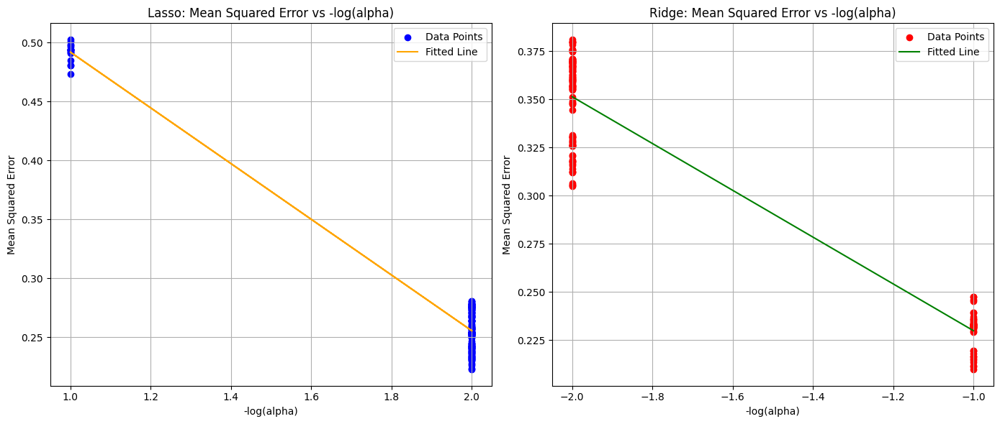

In [ ]:

# Fit a linear regression line to the scatter plots
# Calculate -log(alpha) values
neg_log_alphas_lasso = -np.log10(unique_alphas_lasso)
neg_log_alphas_ridge = -np.log10(unique_alphas_ridge)

# Reshape the data to fit the model
X_lasso = neg_log_alphas_lasso.reshape(-1, 1)
y_lasso = mse_alpha_lasso

X_ridge = neg_log_alphas_ridge.reshape(-1, 1)
y_ridge = mse_alpha_ridge

# Initialize and fit the linear regression model
lin_reg_lasso = LinearRegression()
lin_reg_lasso.fit(X_lasso, y_lasso)

lin_reg_ridge = LinearRegression()
lin_reg_ridge.fit(X_ridge, y_ridge)

# Predict y values for the fitted line
y_pred_lasso = lin_reg_lasso.predict(X_lasso)
y_pred_ridge = lin_reg_ridge.predict(X_ridge)

# Generate the updated plots with the fitted line
plt.figure(figsize=(14, 6))

# Lasso
plt.subplot(1, 2, 1)
plt.scatter(X_lasso, y_lasso, color='blue', label='Data Points')
plt.plot(X_lasso, y_pred_lasso, color='orange', label='Fitted Line')
plt.title('Lasso: Mean Squared Error vs -log(alpha)')
plt.xlabel('-log(alpha)')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True)

# Ridge
plt.subplot(1, 2, 2)
plt.scatter(X_ridge, y_ridge, color='red', label='Data Points')
plt.plot(X_ridge, y_pred_ridge, color='green', label='Fitted Line')
plt.title('Ridge: Mean Squared Error vs -log(alpha)')
plt.xlabel('-log(alpha)')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# Time-Series Plot of Portfolio Returns
#### A simple time-series graph can show how each portfolio's returns evolve over time.

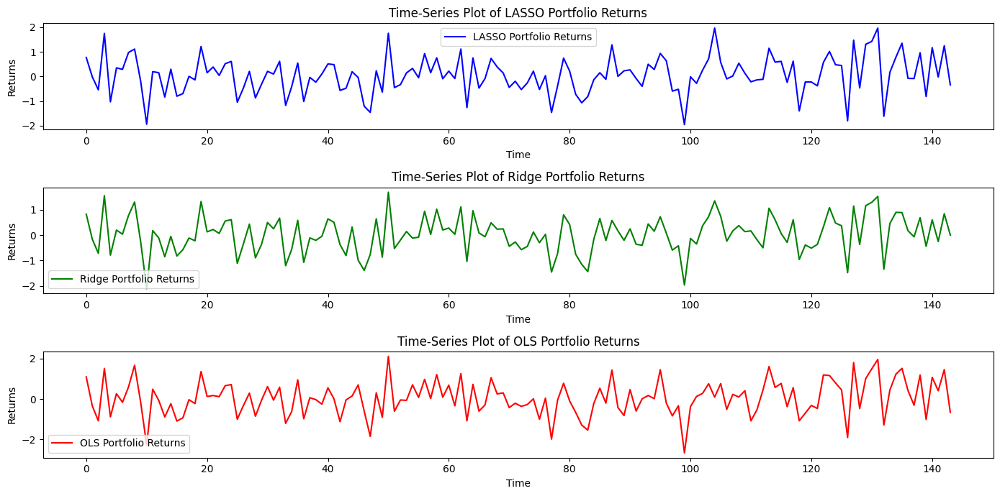

In [ ]:
# Importing matplotlib for plotting
import matplotlib.pyplot as plt

# Generate Time-Series Plot of Portfolio Returns
plt.figure(figsize=(14, 7))

# Plotting for LASSO
plt.subplot(3, 1, 1)
plt.plot(test_performance_lasso, color='b', label='LASSO Portfolio Returns')
plt.title('Time-Series Plot of LASSO Portfolio Returns')
plt.xlabel('Time')
plt.ylabel('Returns')
plt.legend()

# Plotting for Ridge
plt.subplot(3, 1, 2)
plt.plot(test_performance_ridge, color='g', label='Ridge Portfolio Returns')
plt.title('Time-Series Plot of Ridge Portfolio Returns')
plt.xlabel('Time')
plt.ylabel('Returns')
plt.legend()

# Plotting for OLS
plt.subplot(3, 1, 3)
plt.plot(test_performance_ols, color='r', label='OLS Portfolio Returns')
plt.title('Time-Series Plot of OLS Portfolio Returns')
plt.xlabel('Time')
plt.ylabel('Returns')
plt.legend()

# Show plot
plt.tight_layout()
plt.show()



# Cumulative Returns Over Time
#### The above figure consists of three subplots, each showing the cumulative returns of the portfolios generated by the LASSO, Ridge, and OLS models.

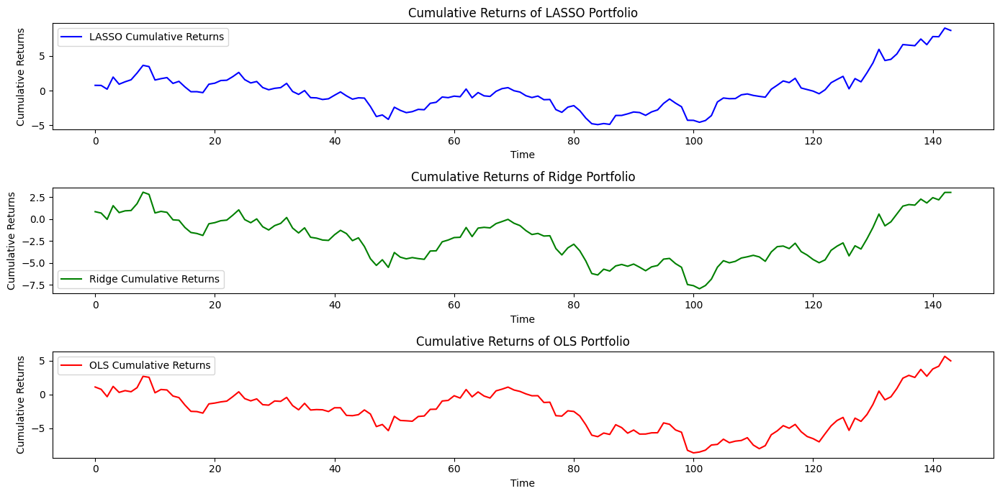

In [ ]:
# Generate Cumulative Returns Over Time

# Calculate Cumulative Returns
cumulative_returns_lasso = np.cumsum(test_performance_lasso)
cumulative_returns_ridge = np.cumsum(test_performance_ridge)
cumulative_returns_ols = np.cumsum(test_performance_ols)

# Create the plot
plt.figure(figsize=(14, 7))

# Plotting for LASSO
plt.subplot(3, 1, 1)
plt.plot(cumulative_returns_lasso, color='b', label='LASSO Cumulative Returns')
plt.title('Cumulative Returns of LASSO Portfolio')
plt.xlabel('Time')
plt.ylabel('Cumulative Returns')
plt.legend()

# Plotting for Ridge
plt.subplot(3, 1, 2)
plt.plot(cumulative_returns_ridge, color='g', label='Ridge Cumulative Returns')
plt.title('Cumulative Returns of Ridge Portfolio')
plt.xlabel('Time')
plt.ylabel('Cumulative Returns')
plt.legend()

# Plotting for OLS
plt.subplot(3, 1, 3)
plt.plot(cumulative_returns_ols, color='r', label='OLS Cumulative Returns')
plt.title('Cumulative Returns of OLS Portfolio')
plt.xlabel('Time')
plt.ylabel('Cumulative Returns')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()



# Narrow the 100 assets to 6 assets

In [ ]:
df_sliced_6assets = df_sliced.iloc[:, 0:7]
df_sliced_6assets_minvar = df_sliced_minvar.iloc[:, 0:7]

In [ ]:
# Step 1: Demean the Return Data (R)
# Drop the 'Unnamed: 0' column as it contains datetime objects
R_6assets = df_sliced_6assets_minvar.drop(columns=['Unnamed: 0']).astype(float)  # Convert data to float type
R_demeaned_6assets = scale(R_6assets, with_mean=True, with_std=False)  # Demean the data

# Step 2: Calculate y
# Create an equally weighted portfolio (wEW)
p_6assets = R_demeaned_6assets.shape[1]  # Number of assets
wEW_6assets = np.ones(p_6assets) / p_6assets  # Equally weighted

# Calculate y = R * wEW
y_6assets = np.dot(R_demeaned_6assets, wEW_6assets)

# Step 3: Construct N and Calculate X
# Create the identity matrix (Ip-1) and a vector of all ones (1p-1)
Ip_1_6assets = np.identity(p_6assets - 1)
one_p_1_6assets = np.ones(p_6assets - 1)

# Construct the matrix N
N_6assets = np.vstack((Ip_1_6assets, -one_p_1_6assets))

# Calculate X = R * N
X_6assets = np.dot(R_demeaned_6assets, N_6assets)

# Step 4: Perform OLS to find beta
# Initialize the linear regression model without intercept
lin_reg_6assets = LinearRegression(fit_intercept=False)

# Fit the model
lin_reg_6assets.fit(X_6assets, y_6assets)

# Extract beta coefficients
beta_6assets = lin_reg_6assets.coef_

# Step 5: Calculate w for MinVar Portfolio
# Calculate w = wEW - N * beta
# Reshaping beta to make it a column vector (for matrix multiplication compatibility)
beta_column_vector_6assets = beta_6assets.reshape(-1, 1)

w_minvar_6assets = wEW_6assets - np.dot(N_6assets, beta_column_vector_6assets).flatten()

# Display the weights of the MinVar portfolio
w_minvar_6assets


array([-0.37557609, -0.04628394, -0.19910571,  0.10350876,  0.15339477,
        1.36406221])

In [ ]:
# Convert the relevant columns of df_sliced to a numpy array after dropping the datetime column and converting to float type
R_sliced_array_6assets = df_sliced_6assets.drop(columns=['Unnamed: 0']).astype(float).to_numpy()

# Calculate the portfolio returns
portfolio_return_6assets = np.dot(R_sliced_array_6assets, w_minvar_6assets)

# Extract the 'Unnamed: 0' column (which contains the dates) from df_sliced
dates_sliced_6assets = df_sliced_6assets['Unnamed: 0']

# Create a new DataFrame to store the portfolio returns along with the corresponding dates
portfolio_return_with_dates_6assets = pd.DataFrame({
    'Date': dates_sliced_6assets,
    'Portfolio_Return': portfolio_return_6assets
})

# Display the first few rows of the new DataFrame to validate
portfolio_return_with_dates_6assets.head()

portfolio_return_with_dates_6assets[portfolio_return_with_dates_6assets['Date'] == '2023-01-03']


,Date,Portfolio_Return
252,2023-01-03,0.365772


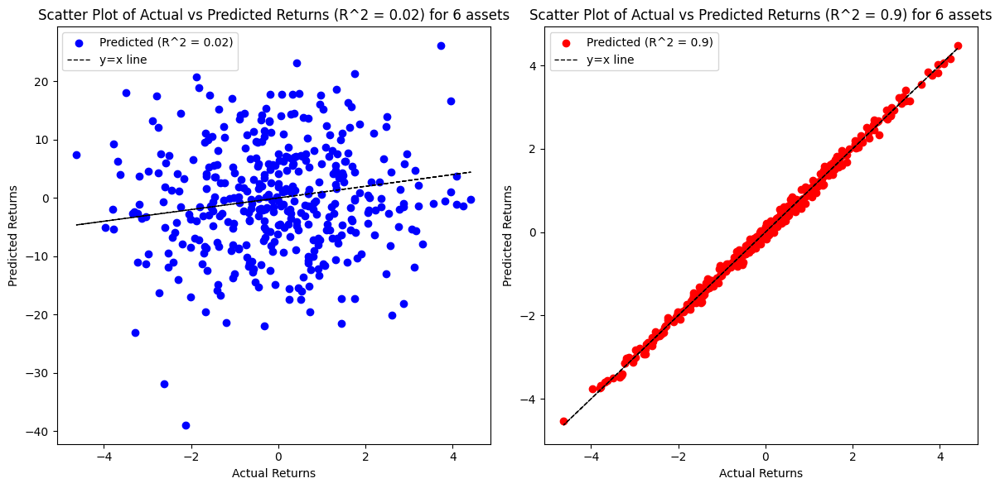

In [ ]:

# Step 1: Actual Portfolio Returns (Already Calculated)
# Using 'portfolio_return_sliced'

# Step 2: Generate Synthetic Predicted Returns

# For R^2 = 0.02, add a large amount of noise
noise_low_r2_6assets = np.random.normal(0, 1, len(portfolio_return_6assets))
predicted_low_r2_6assets = portfolio_return_6assets + noise_low_r2_6assets * 10

# For R^2 = 0.9, add a small amount of noise
noise_high_r2_6assets = np.random.normal(0, 0.1, len(portfolio_return_6assets))
predicted_high_r2_6assets = portfolio_return_6assets + noise_high_r2_6assets

# Scatter plot for R^2 = 0.02
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(portfolio_return_6assets, predicted_low_r2_6assets, c='blue', label='Predicted (R^2 = 0.02)')
plt.plot(portfolio_return_6assets, portfolio_return_6assets, c='black', linestyle='--', linewidth=1, label='y=x line')
plt.xlabel('Actual Returns')
plt.ylabel('Predicted Returns')
plt.title('Scatter Plot of Actual vs Predicted Returns (R^2 = 0.02) for 6 assets')
plt.legend()

# Scatter plot for R^2 = 0.9
plt.subplot(1, 2, 2)
plt.scatter(portfolio_return_6assets, predicted_high_r2_6assets, c='red', label='Predicted (R^2 = 0.9)')
plt.plot(portfolio_return_6assets, portfolio_return_6assets, c='black', linestyle='--', linewidth=1, label='y=x line')
plt.xlabel('Actual Returns')
plt.ylabel('Predicted Returns')
plt.title('Scatter Plot of Actual vs Predicted Returns (R^2 = 0.9) for 6 assets')
plt.legend()

plt.tight_layout()
plt.show()


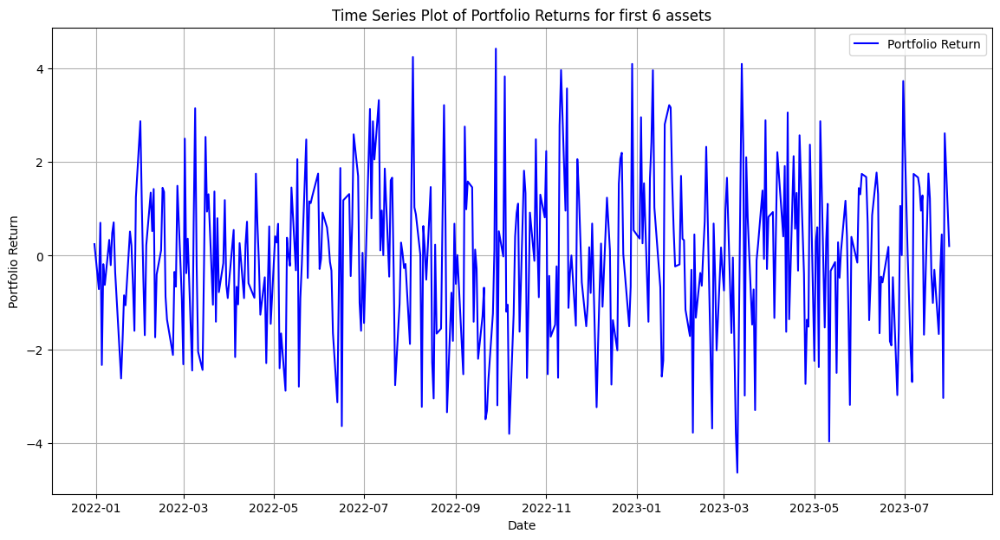

In [ ]:
# Generate a Time Series Plot of the Portfolio Returns

# Create the plot
plt.figure(figsize=(14, 7))
plt.plot(portfolio_return_with_dates_6assets['Date'],
         portfolio_return_with_dates_6assets['Portfolio_Return'],
         label='Portfolio Return', color='b')
plt.xlabel('Date')
plt.ylabel('Portfolio Return')
plt.title('Time Series Plot of Portfolio Returns for first 6 assets')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

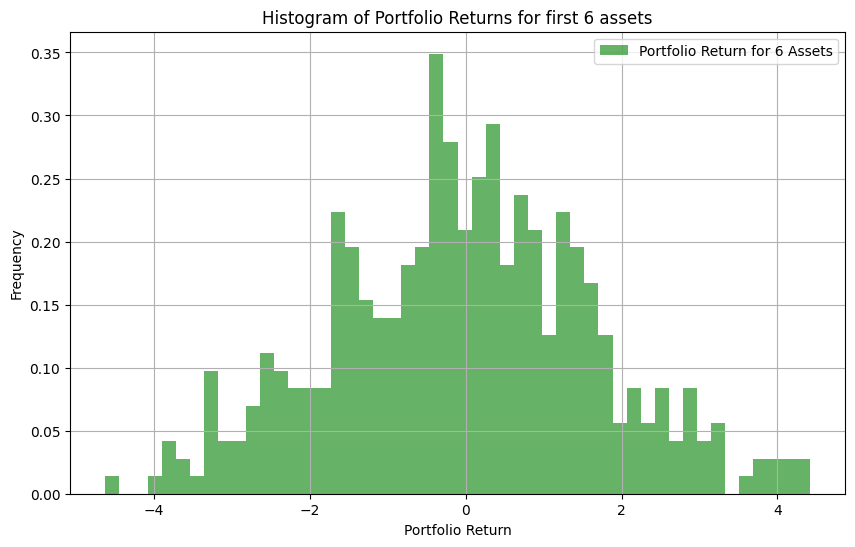

In [ ]:
# Generate a Histogram or Density Plot of the Portfolio Returns

# Create the plot
plt.figure(figsize=(10, 6))
plt.hist(portfolio_return_6assets,
         bins=50,
         density=True,
         alpha=0.6,
         color='g',
         label='Portfolio Return for 6 Assets')
plt.xlabel('Portfolio Return')
plt.ylabel('Frequency')
plt.title('Histogram of Portfolio Returns for first 6 assets')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


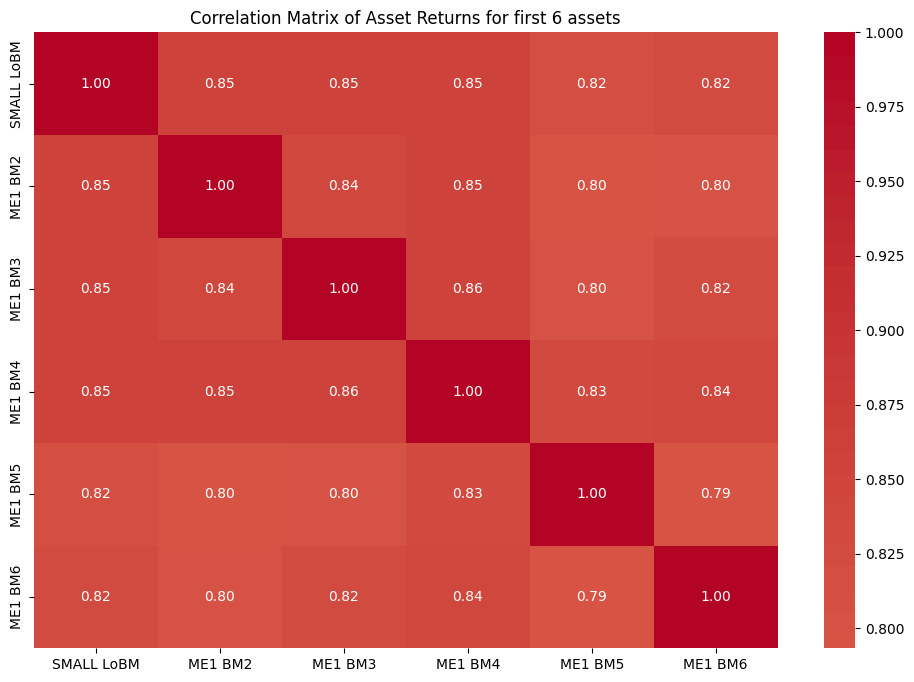

In [ ]:

# Calculate the correlation matrix for the asset returns in df_sliced (excluding the date column)
correlation_matrix_6assets = df_sliced_6assets.drop(columns=['Unnamed: 0']).astype(float).corr()

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_6assets, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Asset Returns for first 6 assets')
plt.show()
